## Plotly Tutorial

In [1]:
import pandas as pd
import numpy as np
import plotly as py
import plotly.express as px
import plotly.io as pio
pio.renderers.default = "notebook"

### Basics

In [2]:
df = pd.DataFrame(np.random.randn(300, 3), columns = ["X", "Y", "Z"])
df.head()

,X,Y,Z
0,0.141030,-0.408848,-0.895043
1,-0.697997,-0.385778,0.627474
2,0.241543,-0.582276,0.092420
3,0.656792,0.709590,0.104391
4,0.824455,-1.178816,-0.211963


<Axes: >

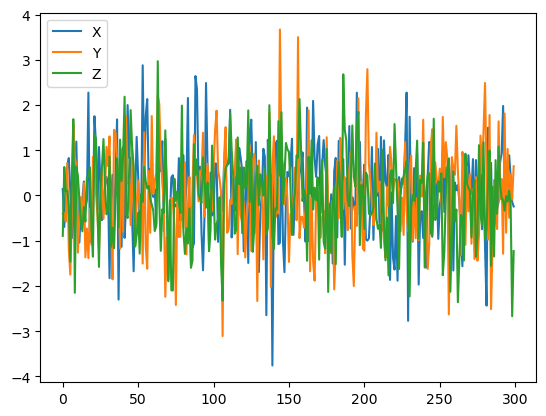

In [3]:
df.plot()
#this is done using matplotlib

* do the same with plotly. Can you see the difference?

In [4]:
fig = px.line(df)
fig.show()

* let's play with gapminder data. Which is the life expectancy trend in Europe in the most populated countries?
Questions
* can you fix the colormap issue like in the matplotlib example?

In [5]:
df = px.data.gapminder().query("continent == 'Europe' and pop > 2.e6")
#
df.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
16,Albania,Europe,1972,67.690,2263554,3313.422188,ALB,8
17,Albania,Europe,1977,68.930,2509048,3533.003910,ALB,8
18,Albania,Europe,1982,70.420,2780097,3630.880722,ALB,8
19,Albania,Europe,1987,72.000,3075321,3738.932735,ALB,8
20,Albania,Europe,1992,71.581,3326498,2497.437901,ALB,8


In [16]:
fig = px.line(df, x="year", y="lifeExp", color='country', hover_data={'year': False})
fig.update_traces(mode="markers+lines", hovertemplate=None)
#fig.update_layout(hovermode="y")
#fig.update_layout(hovermode="x unified")
#
fig.show()

### Customized graphic objects

In [21]:
# Use included Google price data to make one plot
df_stocks = px.data.stocks()
df_stocks.head()


,date,GOOG,AAPL,AMZN,FB,NFLX,MSFT
0,2018-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-01-08,1.018172,1.011943,1.061881,0.959968,1.053526,1.015988
2,2018-01-15,1.032008,1.019771,1.053240,0.970243,1.049860,1.020524
3,2018-01-22,1.066783,0.980057,1.140676,1.016858,1.307681,1.066561
4,2018-01-29,1.008773,0.917143,1.163374,1.018357,1.273537,1.040708


In [24]:
px.line(df_stocks, x='date', y='GOOG', labels={'x':'Date', 'y':'Price'})


In [25]:
# Make multiple line plots
px.line(df_stocks, x='date', y=['GOOG','AAPL'], labels={'x':'Date', 'y':'Price'},
       title='Apple Vs. Google')

In [27]:
# Allows us to create graph objects for making more customized plots
import plotly.graph_objects as go


# Create a figure to which I'll add plots
fig = go.Figure()
# You can pull individual columns of data from the dataset and use markers or not
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL, 
                        mode='lines', name='Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN, 
                        mode='lines+markers', name='Amazon'))
# You can create custom lines (Dashes : dash, dot, dashdot)
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG, 
                        mode='lines+markers', name='Google',
                        line=dict(color='firebrick', width=2, dash='dashdot')))
# Further style the figure
fig.update_layout(title='Stock Price Data 2018 - 2020', xaxis_title='Price', yaxis_title='Date')


In [28]:
# Go crazy styling the figure
fig.update_layout(
    # Shows gray line without grid, styling fonts, linewidths and more
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    # Turn off everything on y axis
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=False,
    ),
    autosize=False,
    margin=dict(
        autoexpand=False,
        l=100,
        r=20,
        t=110,
    ),
    showlegend=False,
    plot_bgcolor='white'
)

### Bar Charts

In [32]:
# Get population change in US by querying for IT data
df_it = px.data.gapminder().query("country == 'Italy'")
fig = px.bar(df_it, x='year', y='pop')

#styling
fig.update_layout(
    title=dict(text="<b>titolo</b>", font=dict(size=30))
)
fig.update_xaxes(title_text="anno", title_font=dict(size=20,color="red"))

fig.add_annotation(x=2007, y=60000000,
            text="maximum",
            showarrow=True,
            arrowhead=1)




In [34]:
import plotly.express as px

long_df = px.data.medals_long()
print(long_df)
fig = px.bar(long_df, x="nation", y="count", color="medal", title="Long-Form Input")
fig.show()

        nation   medal  count
0  South Korea    gold     24
1        China    gold     10
2       Canada    gold      9
3  South Korea  silver     13
4        China  silver     15
5       Canada  silver     12
6  South Korea  bronze     11
7        China  bronze      8
8       Canada  bronze     12


In [35]:
import plotly.express as px

wide_df = px.data.medals_wide()
print(wide_df)
fig = px.bar(wide_df, x="nation", y=["gold", "silver", "bronze"], title="Wide-Form Input")
fig.show()

        nation  gold  silver  bronze
0  South Korea    24      13      11
1        China    10      15       8
2       Canada     9      12      12


* Display pop data for countries in Europe in 2007 greater than 2000000

In [41]:

df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
fig = px.bar(df_europe, y='pop', x='country', text='pop', color='country')#,color_discrete_sequence=px.colors.qualitative.Light24)
# Put bar total value above bars with 2 values of precision
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
# Set fontsize and uniformtext_mode='hide' says to hide the text if it won't fit
fig.update_layout(uniformtext_minsize=8)
# Rotate labels 45 degrees
fig.update_layout(xaxis_tickangle=-45)


### Scatter Plot

In [42]:
# Use included Iris data set
df_iris = px.data.iris()
# Create a scatter plot by defining x, y, different color for count of provided
# column, size based on supplied column and additional data to display on hover
px.scatter(df_iris, x="sepal_width", y="sepal_length", color="species",
                 size='petal_length', hover_data=['petal_width'])


### Pie Charts

In [45]:
# Create Pie chart of the largest nations in Europe
# Color maps here plotly.com/python/builtin-colorscales/
df_samer = px.data.gapminder().query("year == 2007").query("continent == 'Europe'")
print(df_samer.head())
px.pie(df_samer, values='pop', names='country', 
       title='Population of European continent', 
       color_discrete_sequence=px.colors.sequential.RdBu)


                    country continent  year  lifeExp       pop     gdpPercap  \
23                  Albania    Europe  2007   76.423   3600523   5937.029526   
83                  Austria    Europe  2007   79.829   8199783  36126.492700   
119                 Belgium    Europe  2007   79.441  10392226  33692.605080   
155  Bosnia and Herzegovina    Europe  2007   74.852   4552198   7446.298803   
191                Bulgaria    Europe  2007   73.005   7322858  10680.792820   

    iso_alpha  iso_num  
23        ALB        8  
83        AUT       40  
119       BEL       56  
155       BIH       70  
191       BGR      100  


In [48]:

# Customize pie chart
colors = ['blue', 'green', 'black', 'purple', 'red', 'brown']
fig = go.Figure(data=[go.Pie(labels=['Water','Grass','Normal','Psychic', 'Fire', 'Ground'], 
                       values=[110,90,80,80,70,60])])
# Define hover info, text size, pull amount for each pie slice, and stroke
fig.update_traces(hoverinfo='label+percent', textfont_size=20,
                  textinfo='label+percent', pull=[0.1, 0, 0.2, 0, 0, 0],
                  marker=dict(colors=colors, line=dict(color='#FFFFFF', width=2)))

### Density Heatmap

In [54]:
# Create a heatmap using Seaborn data
import seaborn as sns
flights = sns.load_dataset("flights")
print(flights.head())

# You can set bins with nbinsx and nbinsy
fig = px.density_heatmap(flights, x='year', y='month', z='passengers', 
                         color_continuous_scale="Viridis")

fig.show()

   year month  passengers
0  1949   Jan         112
1  1949   Feb         118
2  1949   Mar         132
3  1949   Apr         129
4  1949   May         121


### 3D Scatter Plots

In [52]:
# Create a 3D scatter plot using flight data
fig = px.scatter_3d(flights, x='year', y='month', z='passengers', color='year',
                   opacity=0.7, width=800, height=400)
fig

### Scatter Matrix

In [53]:
# With a scatter matrix we can compare changes when comparing column data
fig = px.scatter_matrix(flights, color='month')
fig

## parallel coordinates

In [55]:
import plotly.express as px
df = px.data.iris()
fig = px.parallel_coordinates(df, color="species_id",
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)
fig.show()

### Polar Chart

In [56]:
# Polar charts display data radially 
# Let's plot wind data based on direction and frequency
# You can change size and auto-generate different symbols as well
df_wind = px.data.wind()
px.scatter_polar(df_wind, r="frequency", theta="direction", color="strength",
                size="frequency", symbol="strength")


In [57]:
# Data can also be plotted using lines radially
# A template makes the data easier to see
px.line_polar(df_wind, r="frequency", theta="direction", color="strength",
                line_close=True, template="plotly_dark", width=800, height=400)


### Facets

In [58]:
# You can create numerous subplots
df_tips = px.data.tips()
px.scatter(df_tips, x="total_bill", y="tip", color="smoker", facet_col="sex")


In [59]:

# We can line up data in rows and columns
px.histogram(df_tips, x="total_bill", y="tip", color="sex", facet_row="time", facet_col="day",
       category_orders={"day": ["Thur", "Fri", "Sat", "Sun"], "time": ["Lunch", "Dinner"]})

In [60]:


# This dataframe provides scores for different students based on the level
# of attention they could provide during testing
att_df = sns.load_dataset("attention")
fig = px.line(att_df, x='solutions', y='score', facet_col='subject',
             facet_col_wrap=5, title='Scores Based on Attention')
fig

### Animated Plots

In [61]:
# Create an animated plot that you can use to cycle through continent
# GDP & life expectancy changes
df_cnt = px.data.gapminder()
px.scatter(df_cnt, x="gdpPercap", y="lifeExp", animation_frame="year", 
           animation_group="country",
           size="pop", color="continent", hover_name="country",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])

In [62]:

# Watch as bars chart population changes
px.bar(df_cnt, x="continent", y="pop", color="continent",
  animation_frame="year", animation_group="country", range_y=[0,4000000000])


## webgl vs canvas

In [66]:
import plotly.express as px
import plotly.graph_objects as go

import pandas as pd
import numpy as np
np.random.seed(1)


N = 100000
X = np.random.randn(N)
Y = np.random.randn(N)

df = pd.DataFrame(dict(x=X, y=Y))



CPU times: user 13.1 ms, sys: 2.27 ms, total: 15.4 ms
Wall time: 13.4 ms


In [67]:
%%time
fig = px.scatter(df, x="x", y="y")
fig.update_traces(marker_line=dict(width=1, color='DarkSlateGray'))
fig.show()

CPU times: user 63.8 ms, sys: 6.17 ms, total: 69.9 ms
Wall time: 69.1 ms


In [68]:
%%time
fig = go.Figure()
fig.add_trace(
    go.Scattergl(
        x = X,
        y = Y,
        mode = 'markers',
        marker = dict(
            line = dict(
                width = 1,
                color = 'DarkSlateGrey')
        )
    )
)
fig.show()

CPU times: user 55.7 ms, sys: 7.69 ms, total: 63.4 ms
Wall time: 61.1 ms
